# Task 1

The images were taken roughly 1.5 inches apart from each other. 

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [17]:
def full_task_1(img1, img2):
    gray_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY)
    gray_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2GRAY)

    sift = cv2.SIFT_create()
    kp_1, des_1 = sift.detectAndCompute(gray_1, None)
    kp_2, des_2 = sift.detectAndCompute(gray_2, None)

    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des_1, des_2, k=2)

    good_matches = []
    pts_1 = []
    pts_2 = []

    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)
            pts_1.append(kp_1[m.queryIdx].pt)
            pts_2.append(kp_2[m.trainIdx].pt)

    pts_1 = np.float32(pts_1)
    pts_2 = np.float32(pts_2)

    print(f"Found {len(good_matches)} good matches")

    img_matches = cv2.drawMatches(
        img_1, kp_1, 
        img_2, kp_2, 
        good_matches[:20], 
        None, 
        matchesThickness=20, 
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )

    plt.figure(figsize=(15, 5))
    plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
    plt.title("Feature Matches")
    plt.axis('off')
    plt.show()


    F, mask = cv2.findFundamentalMat(pts_1, pts_2, cv2.FM_RANSAC, 3, 0.99)
    print(f"Fundamental Matrix:\n{F}")

    pts_1_inliers = pts_1[mask.ravel() == 1]
    pts_2_inliers = pts_2[mask.ravel() == 1]

    def draw_epipolar_lines(img1, img2, lines, pts1, pts2):
        """Draw epipolar lines on img1 and corresponding points on both images"""
        r, c = img1.shape[:2]
        img1_color = img1.copy()
        img2_color = img2.copy()
        
        for r_line, pt1, pt2 in zip(lines[:20], pts1[:20], pts2[:20]):
            color = tuple(np.random.randint(0, 255, 3).tolist())
            x0, y0 = map(int, [0, -r_line[2]/r_line[1]])
            x1, y1 = map(int, [c, -(r_line[2]+r_line[0]*c)/r_line[1]])
            img1_color = cv2.line(img1_color, (x0, y0), (x1, y1), color, 2)
            img1_color = cv2.circle(img1_color, tuple(map(int, pt2)), 20, color, -1)
            img2_color = cv2.circle(img2_color, tuple(map(int, pt1)), 20, color, -1)
        
        return img1_color, img2_color

    lines_2 = cv2.computeCorrespondEpilines(pts_1_inliers.reshape(-1, 1, 2), 1, F)
    lines_2 = lines_2.reshape(-1, 3)
    img_2_lines, img_1_pts = draw_epipolar_lines(img_2, img_1,   # SWAPPED!
                                                        lines_2, pts_1_inliers, 
                                                        pts_2_inliers)

    lines_1 = cv2.computeCorrespondEpilines(pts_2_inliers.reshape(-1, 1, 2), 2, F)
    lines_1 = lines_1.reshape(-1, 3)
    img_1_lines, img_2_pts = draw_epipolar_lines(img_1, img_2,    # SWAPPED!
                                                        lines_1, pts_2_inliers, 
                                                        pts_1_inliers)
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    axes[0, 0].imshow(cv2.cvtColor(img_1_lines, cv2.COLOR_BGR2RGB))
    axes[0, 0].set_title("Epipolar Lines on 1 Image")
    axes[0, 1].imshow(cv2.cvtColor(img_2_pts, cv2.COLOR_BGR2RGB))
    axes[0, 1].set_title("Corresponding Points on 2 Image")
    axes[1, 0].imshow(cv2.cvtColor(img_1_pts, cv2.COLOR_BGR2RGB))
    axes[1, 0].set_title("Corresponding Points on 1 Image")
    axes[1, 1].imshow(cv2.cvtColor(img_2_lines, cv2.COLOR_BGR2RGB))
    axes[1, 1].set_title("Epipolar Lines on 2 Image")
    for ax in axes.flat:
        ax.axis('off')
    plt.tight_layout()
    plt.savefig('epipolar_lines.png')
    plt.show()

    gray_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY)
    gray_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2GRAY)

    window_size = 3
    min_disp = 0
    num_disp = 112 

    stereo_sgbm = cv2.StereoSGBM_create(
        minDisparity=min_disp,
        numDisparities=num_disp,
        blockSize=window_size,
        P1=8 * 3 * window_size ** 2,
        P2=32 * 3 * window_size ** 2,
        disp12MaxDiff=1,
        uniquenessRatio=15,
        speckleWindowSize=50,
        speckleRange=2,
        preFilterCap=63,
        mode=cv2.STEREO_SGBM_MODE_SGBM_3WAY
    )

    disparity = stereo_sgbm.compute(gray_1, gray_2).astype(np.float32) / 16.0
    disparity_vis = cv2.normalize(disparity, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB))
    axes[0].set_title("1 Image")
    axes[1].imshow(cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB))
    axes[1].set_title("2 Image")
    axes[2].imshow(disparity_vis, cmap='jet')
    axes[2].set_title("Disparity Map (Hot = Close, Cold = Far)")
    for ax in axes:
        ax.axis('off')
    plt.tight_layout()
    plt.savefig('disparity_simple.png')
    plt.show()

Found 1465 good matches


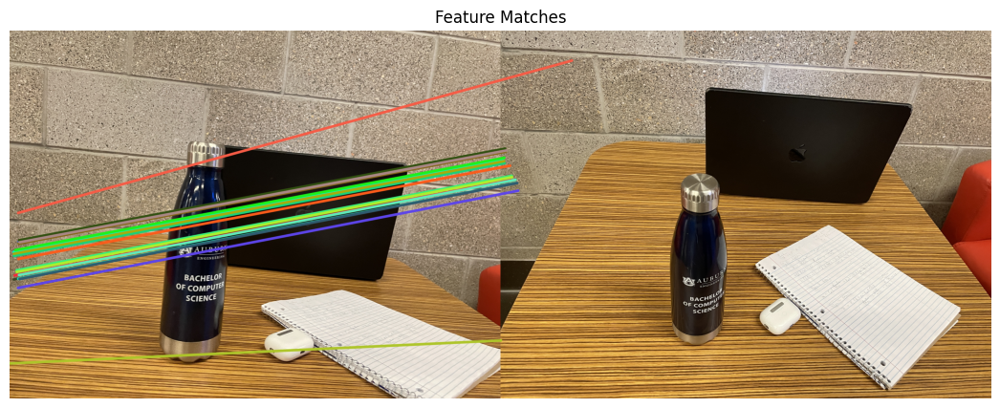

Fundamental Matrix:
[[-5.57791259e-08  1.37719965e-06 -2.35965827e-03]
 [-1.48809010e-06 -1.50855753e-07  2.39101736e-03]
 [ 1.51083351e-03 -1.78202461e-03  1.00000000e+00]]


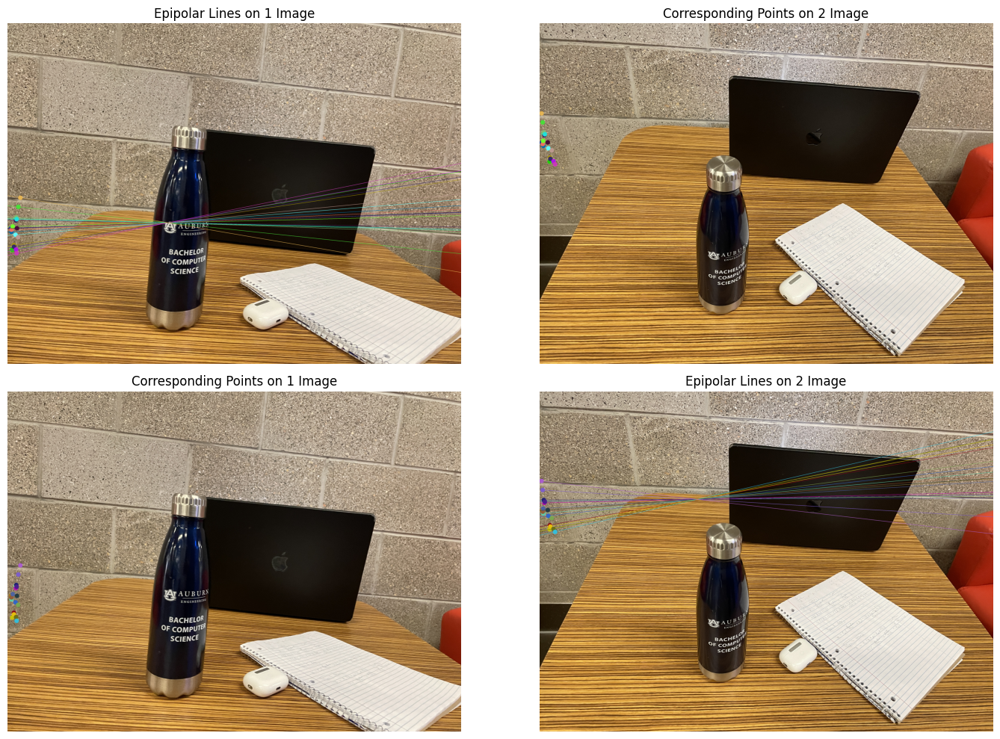

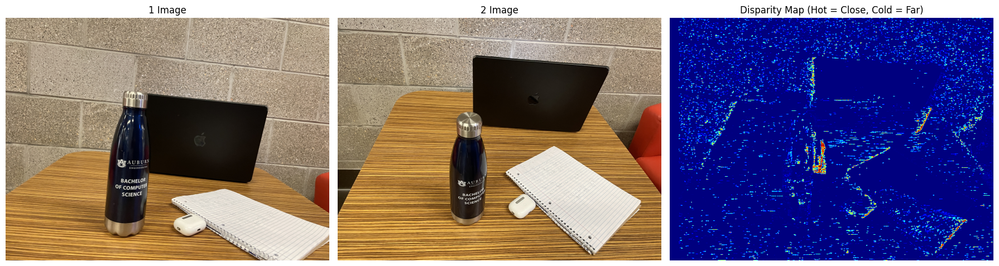

In [19]:
img_1 = cv2.imread('disparity_images/bottom.JPG')
img_2 = cv2.imread('disparity_images/top.JPG')

full_task_1(img_1, img_2)

Found 6334 good matches


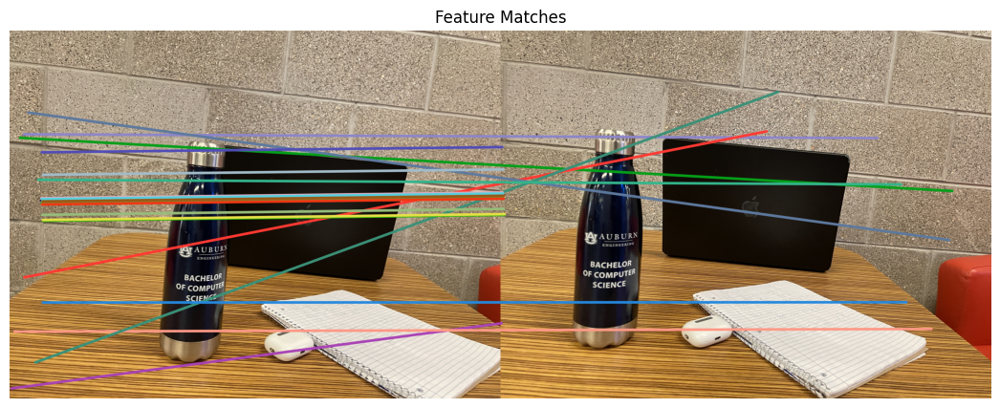

Fundamental Matrix:
[[ 3.60794455e-08 -7.02529102e-06  6.17117257e-03]
 [ 7.06777469e-06  8.50533020e-08 -1.82551797e-02]
 [-5.99620952e-03  1.61760933e-02  1.00000000e+00]]


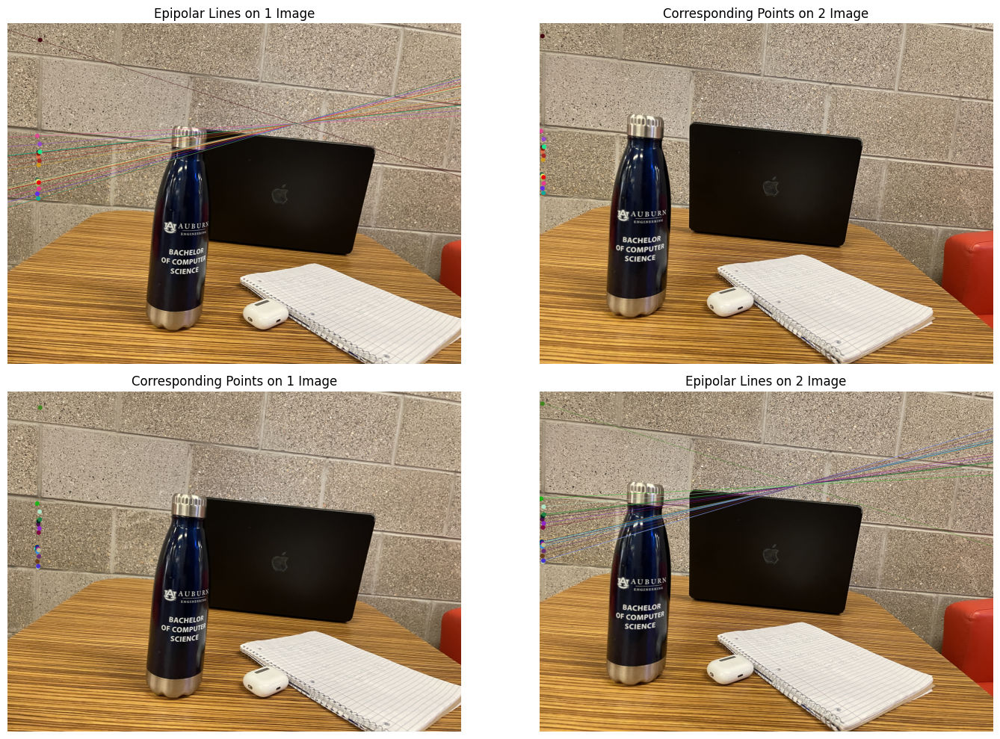

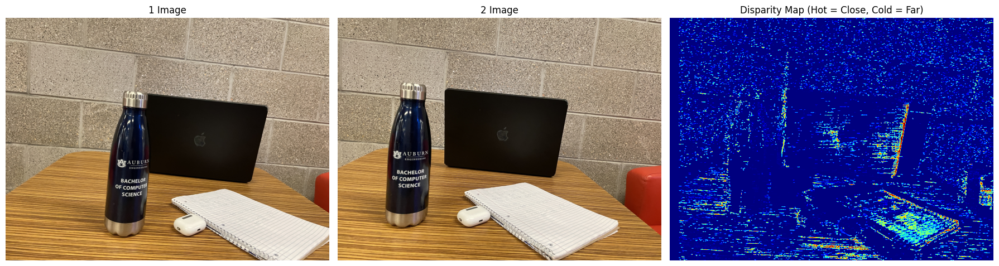

In [20]:
img_1 = cv2.imread('disparity_images/bottom.JPG')
img_2 = cv2.imread('disparity_images/distance_1_inch.JPG')

full_task_1(img_1, img_2)

Found 5047 good matches


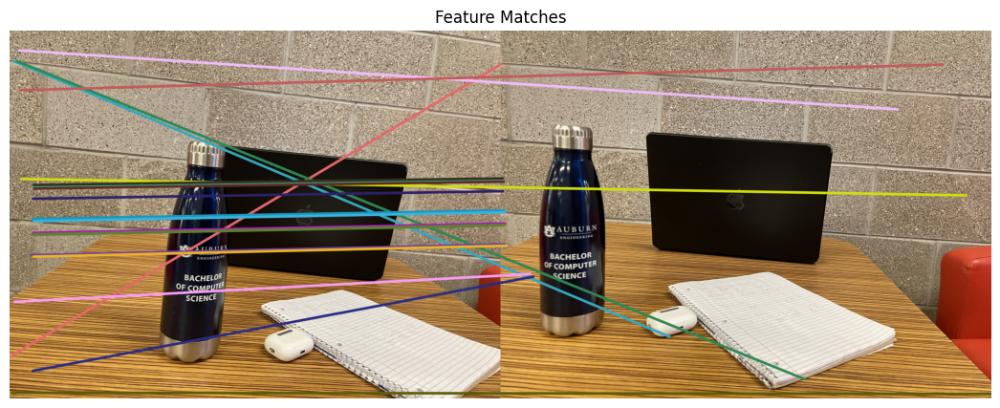

Fundamental Matrix:
[[ 4.63613591e-09 -1.68990778e-06  3.61128656e-03]
 [ 1.86488174e-06  3.72386350e-08 -9.81713499e-03]
 [-3.80493752e-03  8.76985041e-03  1.00000000e+00]]


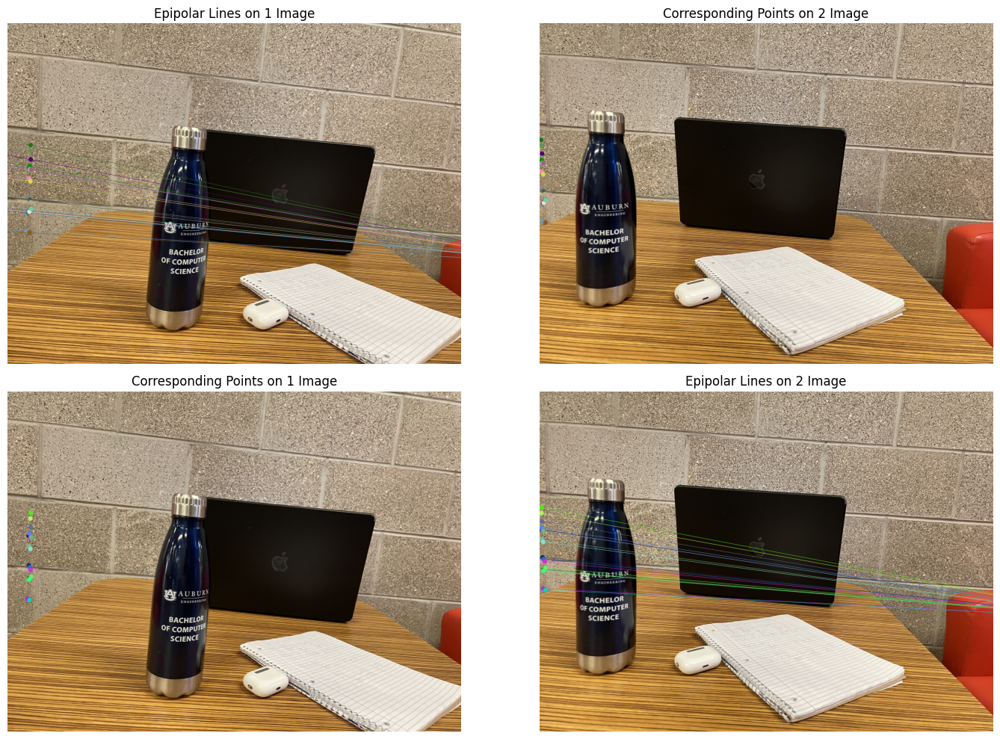

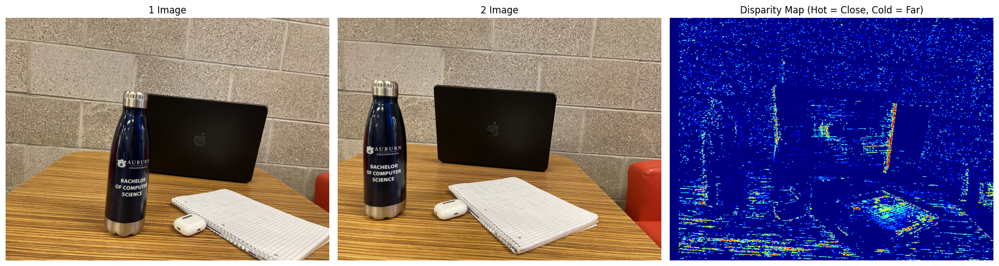

In [21]:
img_1 = cv2.imread('disparity_images/bottom.JPG')
img_2 = cv2.imread('disparity_images/distance_4_inches.JPG')

full_task_1(img_1, img_2)